# Description

본 문서의 목표는 주피터 노트북으로 DKT를 순서대로 구현하는 것임

# 0. Package

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils

import numpy as np
import pandas as pd

# 1. Data Upload and EDA

In [2]:
data_path = 'data/2015_100_skill_builders_main_problems.csv'
data_pd = pd.read_csv(data_path)
data_pd.head()

,user_id,log_id,sequence_id,correct
0,50121,167478035,7014,0.0
1,50121,167478043,7014,1.0
2,50121,167478053,7014,1.0
3,50121,167478069,7014,1.0
4,50964,167478041,7014,1.0


In [3]:
data_pd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708631 entries, 0 to 708630
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   user_id      708631 non-null  int64  
 1   log_id       708631 non-null  int64  
 2   sequence_id  708631 non-null  int64  
 3   correct      708631 non-null  float64
dtypes: float64(1), int64(3)
memory usage: 21.6 MB


In [4]:
data_pd.describe()

,user_id,log_id,sequence_id,correct
count,708631.000000,7.086310e+05,708631.000000,708631.000000
mean,296232.978276,1.695323e+08,22683.474821,0.725502
std,48018.650247,3.608096e+06,41593.028018,0.437467
min,50121.000000,1.509145e+08,5898.000000,0.000000
25%,279113.000000,1.660355e+08,7020.000000,0.000000
50%,299168.000000,1.704579e+08,9424.000000,1.000000
75%,335647.000000,1.723789e+08,14442.000000,1.000000
max,362374.000000,1.754827e+08,236309.000000,1.000000


In [5]:
data_pd = data_pd.loc[:, ['user_id', 'sequence_id', 'correct']]

print(data_pd.shape)

data_pd.head()

(708631, 3)


,user_id,sequence_id,correct
0,50121,7014,0.0
1,50121,7014,1.0
2,50121,7014,1.0
3,50121,7014,1.0
4,50964,7014,1.0


In [6]:
#numpy.ndarray로 변환
data_np = data_pd.to_numpy()
#데이터를 int64로 변환
data_np = data_np.astype(np.int64)
#데이터 타입 확인
print(data_np.dtype)
#데이터 형태 확인
print(data_np.shape)
#예시 출력
print(data_np[0])
#각각의 원소 출력 확인
print(data_np[0, 0])
#열별로 데이터 추출
print(data_np[:, 0])
print(data_np[:, 1])
print(data_np[:, 2])

int64
(708631, 3)
[50121  7014     0]
50121
[ 50121  50121  50121 ... 362374 362374 362374]
[ 7014  7014  7014 ... 31260 31260 31260]
[0 1 1 ... 1 1 1]


# 2. Data Handling

여기서부터는 데이터를 DKT 모델에 넣을 수 있도록 가공할 예정임

1. 각 문항과 정오답 정보를 one-hot encoding함
2. 데이터 셋의 총 문항의 수가 M개라면 one-hot vector는 2M 차원임
3. 정답인 경우 0~M 인덱스에 해당하는 위치에 1을 기록하고, 오답인 경우 M+1~2M 인덱스에 해당하는 위치에 1을 기록함
4. 학생 별로 학생이 푼 문항에 대한 one-hot vector를 가질 수 있도록 데이터 정리
5. 모든 학생들을 정리
6. 예시 형태
[
    #학생1
    [
        [0, 1, 0, 0, ..., 0],
        [0, 1, 0, 0, ..., 0],
        ...
    ],
    #학생2
    [
        [0, 1, 0, 0, ..., 0],
        [0, 1, 0, 0, ..., 0],
        ...
    ],
    ....
]


In [7]:
#변수정리

#학생, 문항, 정답을 각각 np.array로 나눠서 담음
students = data_np[:, 0]
items = data_np[:, 1]
answers = data_np[:, 2]

print('데이터 전체 길이: ', students.shape)

#n_students, 순수한 학생의 수만 담은 변수
n_students = np.unique(students, return_counts=True)
n_students = n_students[0].shape[0]

#n_items, 순수한 문항의 수만 담은 변수
n_items = np.unique(items, return_counts=True)
n_items = n_items[0].shape[0]

print('중복되지 않는 학생 수(n_students): ', n_students)
print('중복되지 않는 문항 수(n_items): ', n_items)

#인덱스 테스트
idx_students = np.unique(students)
idx_items = np.unique(items)

print('중복되지 않는 학생의 인덱스: ', idx_students)
print('중복되지 않는 문항의 인덱스: ', idx_items)

#중복되지 않은 학생과 문항의 인덱스


데이터 전체 길이:  (708631,)
중복되지 않는 학생 수(n_students):  19917
중복되지 않는 문항 수(n_items):  100
중복되지 않는 학생의 인덱스:  [ 50121  50964  52189 ... 362264 362271 362374]
중복되지 않는 문항의 인덱스:  [  5898   5918   5945   5961   5962   5965   5968   5969   5976   6009
   6018   6022   6039   6402   6465   6473   6849   6851   6891   6910
   6913   6921   6937   6943   7012   7014   7020   7035   7155   7156
   7157   7158   7159   7160   7165   7166   7167   7179   7182   7183
   7184   7185   7192   7195   7196   8585   8741   8864   8928   8946
   8949   9180   9222   9244   9245   9423   9424   9428  10195  10264
  10265  10293  10597  10763  10765  10767  10833  11829  11831  11836
  11893  11898  11899  12450  13731  13935  14168  14211  14247  14442
  15528  19362  19610  21257  24173  26902  31260  31277  31825  37002
  37055  37374  37570  37876  37980  39162  39885 164496 204037 236309]


In [8]:
#one_hot_vectors 생성
one_hot_vectors = np.zeros((len(items), n_items * 2))

print("one_hot_vectors shape: ", one_hot_vectors.shape)
print("one_hot_vectors: ", one_hot_vectors)

#items + answers to one-hot vectors

#idx = list(idx_items).index(data_np[0][1])
#print(idx) -> index에 해당하는 수가 나옴

for i, data in enumerate(data_np):
    #첫 행의 문항이 idx_items의 몇 번째 인덱스인지 파악해서 idx에 저장
    #data_np[i][1]은 i행의 문항임
    idx = list(idx_items).index(data_np[i][1])
    #정답이라면 처음~M에 1(정답값)을 더하고,
    one_hot_vectors[i, idx] += data_np[i][2] #정답값
    #오답이면 M+1~2M에 1(정답값)을 더한다.
    one_hot_vectors[i, idx + n_items] += 1 - data_np[i][2] #정답값

print("after add 1: ", one_hot_vectors[0])
print("after add 1 type: ", type(one_hot_vectors))

one_hot_vectors shape:  (708631, 200)
one_hot_vectors:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
after add 1:  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
after add 1 type:  <class 'numpy.ndarray'>


In [9]:
# 리스트로 변경
# numpy가 속도 문제의 원인이라고 생각했는데, 다른 문제였음(print의 문제)
# 만약 개선 가능하다면 numpy로 변경해보기(더 간결하다면)

students = list(students)
one_hot_vectors = list(one_hot_vectors)
idx_students = list(idx_students)

#unique한 idx_students의 각각의 요소들에 0부터 인덱스를 딕셔너리 형태로 달아줌
students_id_to_idx = {}

for i, unique_student in enumerate(idx_students):
    students_id_to_idx[unique_student] = i

#print(students_id_to_idx) 출력시
#{50121: 0, 50964: 1, 52189: 2, 62430: 3, ...}

#batches 만들기
#batches는 []안에 unique한 학생의 수만큼의 빈 []를 넣어두는 변수
#이후에 각 학생별 [] 안에 학생이 푼 one_hot_vector를 집어넣을 것임
dummy_batches = []

#dummy_batches에 학생의 유니크 한 수만큼의 빈 리스트 넣기
for i in range(len(idx_students)):
    dummy_batches.append([])

#학생의 인덱스에 맞는 빈 리스트에 one_hot_vector를 리스트형태로 넣기
for i in range(len(students)):
    idx = students_id_to_idx[students[i]]
    dummy_batches[idx].append(one_hot_vectors[i])

#진짜 batches를 받을 수 있도록 처리
batches = []

#dummy_batches에서 학생별로 데이터를 꺼내서 torch.Tensor로 바꿈
for batch in dummy_batches:
    batches.append(torch.Tensor(batch))

print(batches)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: UserWarning: Legacy tensor constructor is deprecated. Use: torch.tensor(...) for creating tensors from tensor-like objects; or torch.empty(...) for creating an uninitialized tensor with specific sizes. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_new.cpp:478.)


[tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         

In [10]:
print(type(batches))
print(type(batches[0]))
print(type(batches[0][0]))

<class 'list'>
<class 'torch.Tensor'>
<class 'torch.Tensor'>


In [11]:
#train, validation, test set 비율 나누기

ratios = [.6, .2, .2]

#전체 19917을 각각 비율로 나눔
train_cnt = int(len(batches) * ratios[0])
valid_cnt = int(len(batches) * ratios[1])
test_cnt = len(batches) - train_cnt - valid_cnt

cnts = [train_cnt, valid_cnt, test_cnt]

print("Train %d / Valid %d / Test %d" % (train_cnt, valid_cnt, test_cnt))

Train 11950 / Valid 3983 / Test 3984


In [12]:
#전체 데이터셋을 무작위로 섞은 후
#Train과 Valid, Test를 각각 분리하여 저장하기

#여기서 데이터가 list와 torch.Tensor가 섞여 있어서, index_select가 작동하지 않음
#그리고 각 학생별 푼 문제의 양이 달라서, 데이터의 형상이 맞지 않아서, torch.Tensor로 변환하기에
#문제가 있음

#아래 코드를 수정하여 문제를 해결하여야 함

#1. 전체 데이터셋 무작위로 섞기

import random

#batches를 섞기 전
print('before shuffle: ', batches[0])

#batches의 학생별 데이터를 섞어주는 코드
batches = random.sample(batches, len(batches))

#batches를 섞은 후
print('after shuffle: ', batches[0])

#출력을 보고 제대로 섞였는지 확인하기

before shuffle:  tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [13]:
#2. 섞은 데이터셋을 train, Valid, Test로 나누기

train_data = batches[:cnts[0]]
valid_data = batches[cnts[0]:cnts[0] + cnts[1]]
test_data = batches[cnts[0] + cnts[1]:]

#제대로 나뉘었는지 확인하기
print('train_data 크기: ', len(train_data))
print('valid_data 크기: ', len(valid_data))
print('test_data 크기: ', len(test_data))

train_data 크기:  11950
valid_data 크기:  3983
test_data 크기:  3984


In [29]:
# hyper parameters
input_size = len(batches[0][0])
hidden_size = 50
batch_size = 64
n_epochs = 100
print_interval= 1
early_stop = 100

#device 정의
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(input_size)

200


In [15]:
#데이터의 길이가 변하는 경우 DataLoader를 사용하려면
#collated_fn 옵션을 조정해야함, 아래 블로그 참고
#https://sanghyu.tistory.com/90

#juno-dkt에서는 아래와 같은 정의를 DataLoader의 collate_fn = collate라고
#정의하고 아래와 같은 함수를 util에 넣음
def collate(batch):
    #가변길이 함수에 padding을 넣어주는 것
    #https://runebook.dev/ko/docs/pytorch/generated/torch.nn.utils.rnn.pad_sequence
    return nn.utils.rnn.pad_sequence(batch)

#dataloader test

from torch.utils.data import Dataset, DataLoader

train_loader = DataLoader(
    dataset = train_data,
    batch_size = batch_size,
    shuffle = True,
    collate_fn=collate
)

valid_loader = DataLoader(
    dataset = valid_data,
    batch_size = batch_size,
    shuffle = True,
    collate_fn=collate
)

test_loader = DataLoader(
    dataset = test_data,
    batch_size = batch_size,
    shuffle = True,
    collate_fn=collate
)

In [16]:
print("Train %d / Valid %d / Test %d samples." % (
    len(train_loader.dataset),
    len(valid_loader.dataset),
    len(test_loader.dataset)
))

Train 11950 / Valid 3983 / Test 3984 samples.


In [17]:
# model
# class로 정의

# input_size = batches[0].size(-1) -> 200임
# hidden_size = 50 -> 준오쌤꺼 가져옴


class DKT(nn.Module):

    def __init__(
        self,
        input_size,
        hidden_size,
        #rnn은 hidden_size가 output_size이기에 필요가 없지만, 일관성을 위해 넣음
        #output_size,
        n_layers=4,
        dropout_p=.2,
    ):
        self.input_size = input_size
        self.hidden_size = hidden_size
        #self.output_size = output_size
        self.n_layers = n_layers
        self.dropout_p = dropout_p

        super().__init__()

        self.rnn = nn.LSTM(
            #input_size는 총 문항 수의 두배인 2M개임
            input_size = input_size,
            hidden_size = hidden_size, 
            num_layers = n_layers,
            #(입력 데이터의 가장 첫번째 차원이 batch가 될 수 있도록 batch_first 옵션을 줌)
            #data loader를 통과하니 순서가 바뀌어서 일단 수정함
            #입력되는 데이터가 (sequence, bs, length) 순서임
            batch_first = False,
            dropout = dropout_p,
        )

        self.layers = nn.Sequential(
            #Linear 층에서 hidden_size를 크기로 받고, input_size/2(M개)로 출력
            #input_size/2를 넣으니 오류가 나서 int로 감싸서 넣음
            nn.Linear(hidden_size, int(input_size/2)),
            #Linear를 통과한 값을 Sigmoid로 감싸서 확률값으로 나오도록 만듦
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # |x| = (batch_size, h, w) = (bs, sequence_length, vector_size)
        z, _ = self.rnn(x)
        # rnn의 output으로 output과 (h_n, c_n)이 나옴
        # 뒷 값은 필요없으므로, _로 무시
        # output인 |z| = (batch_size, sequence_length, hidden_size)
        # z는 모든 타입스텝의 결과를 가져오는 것임

        # 우리는 many to one이므로, 마지막 타임스텝의 결과값만 잘라서 가져오면 됨
        #z = z[:, -1]
        
        # |z| = (batch_size, hidden_size)
        y = self.layers(z)
        # |y| = (batch_size, output_size)

        return y

In [19]:
#model 선언
model = DKT(input_size = input_size, hidden_size = hidden_size)

model = model.to(device)

model

DKT(
  (rnn): LSTM(200, 50, num_layers=4, dropout=0.2)
  (layers): Sequential(
    (0): Linear(in_features=50, out_features=100, bias=True)
    (1): Sigmoid()
  )
)

In [20]:
#optimizer 정의
optimizer = optim.Adam(model.parameters())

# Train

In [21]:
from copy import deepcopy

lowest_loss = np.inf
best_model = None

lowest_epoch = np.inf

In [22]:
#_loss test -> 점검 후 수정 해서 투입
# loss = self._loss(y_[:-1], data[1:])
#data는 y_[:-1] 즉, 모델 통과 후의 값(마지막값 제외)
#target은 data[1:] 데이터의 두번째부터 값(0번째는 빼고 1번째부터의 값)

eps = 1e-8

def loss_function(y_hat, y_real):
	#delta는 target이 총 길이가 n_items * 2인데, 
	#이 중에서 앞에 있는 절반([:, :, self.n_items])과
	#뒤에 있는 절반([:, :, self.n_items:])을 합치는 것
	#delta는 결국 one-hot encoding이지만, 차원은 n_itmes임
	#delta = [0, 0, 1, 0 ....] 길이는 n_items
	#delta는 정오답 상관없이 문항의 위치를 알려주는 변수
	delta = y_real[:,:, :n_items] + y_real[:,:, n_items:]
	#sum(axis=-1)은 차원의 마지막을 기준으로 합치는 것
	#즉, 원핫 벡터의 구성요소를 다 더한 것을 bool로 표시
	#tensor([[True, True, True], [True, True, True]])
	mask = delta.sum(axis=-1).type(torch.BoolTensor).to(device)
	#data는 모델 통과 후의 값인데, 차원은 n_items이고, sigmoid()를 통과하여 확률값으로 표시됨
	#여기에 엄청나게 작은 값을 곱하고 더함으로써 매우 작은 값으로 보정함
	#!!!이유는 모르겠음
	y_hat =  y_hat* (1-2*eps) + eps
	#correct는 처음~M까지의 데이터로 여기에는 정답일 경우, 문항 번호를 표기하는 곳임
	#차원은 n_items
	correct = y_real[:,:, :n_items].to(device)
	#correct는 정답에 대한 정오답 벡터(n_items 차원)
	#data.log()는 각 문항에 대한 확률값의 로그값(n_items 차원)
	#공식은 BCE 공식 그대로
	bce = - correct*y_hat.log() - (1-correct)*(1-y_hat).log()
	#bce값을 delta(정답쪽 one-hot과 오답쪽 one-hot을 더한 값, n_items 차원)와 곱한 후
	#이것을 axis -1 방향으로 더함
	#그러면 해당 문항의 bce 값을 알 수 있고, 모든 문항에 대한 확률값을 알 수 있음
	bce = (bce*delta).sum(axis=-1)
	#최종 반환 값에서 bce를 mask를 통해 모두 선택하고, 이를 평균내어 반환함
	return torch.masked_select(bce, mask).mean()

In [30]:
train_history, valid_history = [], []

for i in range(n_epochs):
    model.train()

    train_loss, valid_loss = 0, 0
    y_hat = []

    # train_loader에서 미니배치가 반환됨
    for data in train_loader:
        data = data.to(device)
        #print(data.size())
        y_hat_i = model(data)
        #y_hat_i의 값 크기의 예시는 torch.Size([190, 100]) 이런식으로 반환됨
        #y_hat_i의 각 값은 확률값임

        #loss를 구하기 위해서는 반환된 값의 차원(n_items)과 다음 값의 차원(n_items / 2)로 설정해서 비교해야함
        #따라서 mask를 씌우는 작업이 필요함


        #여기서 계속 애러가 발생!!(y_real이 계속 없다고 나옴)
        #원인을 잘 모르겠음

        #print(data[1:]) #찍어보면 데이터 제대로 나옴
        #print(data[1:].size())

        loss = loss_function(y_hat_i[:-1], data[1:])

        optimizer.zero_grad()
        loss.backward()

        optimizer.step()

    train_loss = train_loss / len(train_loader)

    model.eval()
    with torch.no_grad():
        valid_loss = 0

        for data in valid_loader:
            data = data.to(device)
            y_hat_i = model(data)
            loss = loss_function(y_hat_i[:-1], data[1:])

            valid_loss += float(loss)

            #이건 왜 쓰는거지?   
            y_hat += [y_hat_i]

    valid_loss = valid_loss / len(valid_loader)

    train_history += [train_loss]
    valid_history += [valid_loss]

    if (i + 1) % print_interval == 0:
        print('Epoch %d: train loss=%.4e  valid_loss=%.4e  lowest_loss=%.4e' % (
            i + 1,
            train_loss,
            valid_loss,
            lowest_loss,
        ))

    if valid_loss <= lowest_loss:
        lowest_loss = valid_loss
        lowest_epoch = i
        
        best_model = deepcopy(model.state_dict())
    # else:
    #     if early_stop > 0 and lowest_epoch + early_stop < i + 1:
    #         print("There is no improvement during last %d epochs." % early_stop)
    #         break
    
print("The best validation loss from epoch %d: %.4e" % (lowest_epoch + 1, lowest_loss))
model.load_state_dict(best_model)


Epoch 1: train loss=0.0000e+00  valid_loss=5.4623e-01  lowest_loss=5.4435e-01
Epoch 2: train loss=0.0000e+00  valid_loss=5.4696e-01  lowest_loss=5.4435e-01
Epoch 3: train loss=0.0000e+00  valid_loss=5.4699e-01  lowest_loss=5.4435e-01
Epoch 4: train loss=0.0000e+00  valid_loss=5.4618e-01  lowest_loss=5.4435e-01
Epoch 5: train loss=0.0000e+00  valid_loss=5.4622e-01  lowest_loss=5.4435e-01
Epoch 6: train loss=0.0000e+00  valid_loss=5.4704e-01  lowest_loss=5.4435e-01
Epoch 7: train loss=0.0000e+00  valid_loss=5.4718e-01  lowest_loss=5.4435e-01
Epoch 8: train loss=0.0000e+00  valid_loss=5.4692e-01  lowest_loss=5.4435e-01
Epoch 9: train loss=0.0000e+00  valid_loss=5.4699e-01  lowest_loss=5.4435e-01
Epoch 10: train loss=0.0000e+00  valid_loss=5.4795e-01  lowest_loss=5.4435e-01
Epoch 11: train loss=0.0000e+00  valid_loss=5.4702e-01  lowest_loss=5.4435e-01
Epoch 12: train loss=0.0000e+00  valid_loss=5.4657e-01  lowest_loss=5.4435e-01
Epoch 13: train loss=0.0000e+00  valid_loss=5.4754e-01  lowes

<All keys matched successfully>

# Test

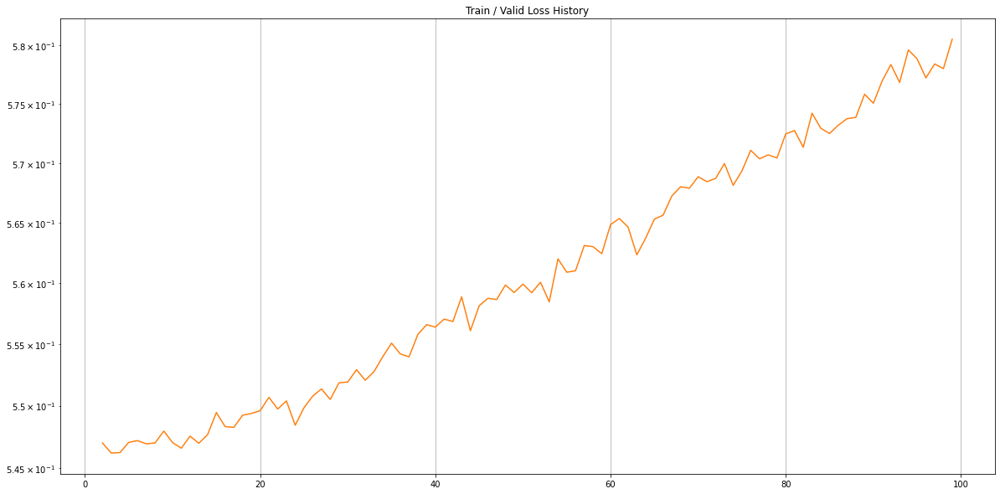

In [31]:
import matplotlib.pyplot as plt

plot_from = 2

plt.figure(figsize = (20, 10))
plt.grid(True)
plt.title("Train / Valid Loss History")
plt.plot(
    range(plot_from, len(train_history)), train_history[plot_from:],
    range(plot_from, len(valid_history)), valid_history[plot_from:],
)

plt.yscale('log')
plt.show()